<a href="https://colab.research.google.com/github/EjbejaranosAI/dl-medical-analysis-images/blob/main/P2_DL4MI_CT_Reconstruction.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Deep learning for medical imaging

Author: Edison Jair Bejarano Sepulveda

==============================================================================================
## Practicum 2: Computed Tomography Image Reconstruction
==============================================================================================

In this practicum, you will (1) simulate a simple phantom slice image, (2) apply Radom forward transformation to simulate the computed tomography (CT) projections over an slice (i.e. sinograms) and (3) reconstruct the original phantom intensity values using different image reconstruction algorithms.  

### Aims:
- Understand the principles of CT image reconstruction using a fan beam geometry with the aid of ``skimage``.
- Be able to generate image projections (i.e. sinograms).
- Reconstruct slices from simple and more complex objects (i.e. Shepp–Logan phantom) using back projection and iterative methods.
- Analyse and compare reconstructed data with ground truth data.
- Observe the difference between ideal (noise free) and noisy image reconstruction.

In [1]:
%matplotlib inline

In [2]:
import numpy as np
import matplotlib.pyplot as plt
from skimage.transform import radon, iradon
from skimage import color
import cv2

### Utils functions

In [212]:
def create_circular_mask(h, w, center=None, radius=None):

    if center is None: # use the middle of the image
        center = (int(w/2), int(h/2))
    if radius is None: # use the smallest distance between the center and image walls
        radius = min(center[0], center[1], w-center[0], h-center[1])

    Y, X = np.ogrid[:h, :w]
    dist_from_center = np.sqrt((X - center[0])**2 + (Y-center[1])**2)

    mask = dist_from_center <= radius
    return mask



def find_lesson(image):
  lesson_location = np.random.choice(np.argwhere(image==2)[:,0])
  return lesson_location

def find_lesson_1(image):
  
  lesson_location = np.random.choice(np.argwhere(image==1)[:,0])
  return lesson_location

def get_angle_a(projection):
  angle =  360.0/projection
  print(angle)
  return angle

def get_angle_b(angle):
  angle =  angle
  print(angle)
  return angle



def plot_sinogram(im,angle,projection):
  theta = np.linspace(0., angle, projection , endpoint=False)
  sinogram = radon(im, theta=theta)
  dx, dy = 0.5 * ang / max(im.shape), 0.5 / sinogram.shape[0]
  ax.imshow(sinogram, cmap=plt.cm.Greys_r,
          extent=(-dx, ang + dx, -dy, sinogram.shape[0] + dy), aspect='auto')
  ax.set_title(f"(Projections:{projection} , Angle: {angle})")
  return 

def plot_sinogram_iradon(im,angle,projection,filter):

  theta = np.linspace(0., angle, projection, endpoint=False)
  sinogram = radon(im, theta=theta)

  reconstruction_fbp = iradon(sinogram, theta=theta, filter_name= filter)
  
  ax.imshow(reconstruction_fbp, cmap=plt.cm.Greys_r, aspect='auto')
  ax.set_title(f"(Filter: {filter}")  
  return reconstruction_fbp


def plot_sinogram_iradon_poison(im,angle,projection,filter):

  theta = np.linspace(0., angle, projection, endpoint=False)
  poison  = np.random.poisson(lam=10, size=None)
  sinogram = radon(im, theta=theta) 
  sinogram *= 255 / sinogram.max() 
  reconstruction_fbp = iradon(sinogram+ poison , theta=theta, filter_name= filter)
  
  ax.imshow(reconstruction_fbp, cmap=plt.cm.Greys_r, aspect='auto')
  ax.set_title(f"(Filter: {filter}")  
  return reconstruction_fbp


def plot_pixel_intensity(phantom):
  # Get the location of the tissue 2
  location = find_lesson(phantom)


  fig = plt.figure(figsize=(16, 10), )
  ax1 = plt.axes()  # standard axes
  ax2 = plt.axes([0.85, 0.48, 0.4, 0.4])
  ax1.plot(np.arange(len(phanton[location])),phanton[location], 'o--')
  ax2.imshow(phanton, cmap='gray')
  ax1.set_title(' Pixel intensity profile along the lesion ')
  ax2.set_title(' Original phanton image')



def multiple_pixel_intensity(phantom):
  # Get the location of the tissue 2
  location = find_lesson(phanton)

  fig = plt.figure(figsize=(16, 10), )
  ax1 = plt.axes()  # standard axes
  ax1.plot(np.arange(len(phanton[location])),phanton[location], 'o--')
  ax1.set_title(' Pixel intensity profile along the lesion ')


def multiple_pixel_intensity_label(phantom,label):

  # Get the location of the tissue 2
  location = find_lesson(phanton)
  #plt.axes()  # standard axes
  plt.plot(np.arange(len(phanton[location])),phanton[location], '.--')

def multiple_pixel_intensity_label_2(phantom,label,lesson_location):

  # Get the location of the tissue 2
  location = find_lesson_1(phanton)
  #plt.axes()  # standard axes
  plt.plot(np.arange(len(phantom[location])),phantom[location], '.--')



def plot_intensity_iradon_lesson(image):
  # insert your code here
  lesson_location = np.random.choice(np.argwhere(image==1)[:,0])
  print(lesson_location)
  fig = plt.figure(figsize=(16, 10), )
  ax1 = plt.axes()  # standard axes
  ax2 = plt.axes([0.85, 0.48, 0.4, 0.4])
  ax1.plot(np.arange(len(image[lesson_location])),image[lesson_location], 'o--')
  ax2.imshow(image, cmap='gray')
  ax1.set_title(' Pixel intensity profile along the lesion ')
  ax2.set_title(' Original phanton image')

def multiple_pixel_intensity_label_2(phantom,label,lesson_location):

  plt.plot(np.arange(len(phantom[lesson_location])),phantom[lesson_location], '.--')
  
# https://newbedev.com/how-can-i-create-a-circular-mask-for-a-numpy-array

### 2.1 Create a simple and homogeneous phantom (1.5 points)

Create a 2D simple phantom which contains a fake lesion as shown below:

<img src='/content/drive/MyDrive/Colab_Notebooks/3_DLMIA/2_delivery/P2-student/images_4_notebook/SimplePhantom.png' width="200">

- Phantom size: 256 x 256 pixels.
- Phantom must contain 3 tissues:
    - Background = 0 pixel intensity value
    - Tissue 1 = 1 (radius = 100 pixels)
    - Tissue 2 (lesion) = 2 (radius = 5 pixels)
    
Help: To create the circunferences, you can use the function ``create_circular_mask``, or define your own function. The lesion could be located in any position within the phantom.

Once constructed, plot the original phantom and a pixel intensity (horizontal) profile along the lesion. Always remember to include the units of the axis when ploting a graph.

In [3]:
from google.colab import drive
drive.mount('/content/drive')
original_img_path ='/content/drive/MyDrive/Colab_Notebooks/3_DLMIA/2_delivery/P2-student/images_4_notebook/SimplePhantom.png'

Mounted at /content/drive


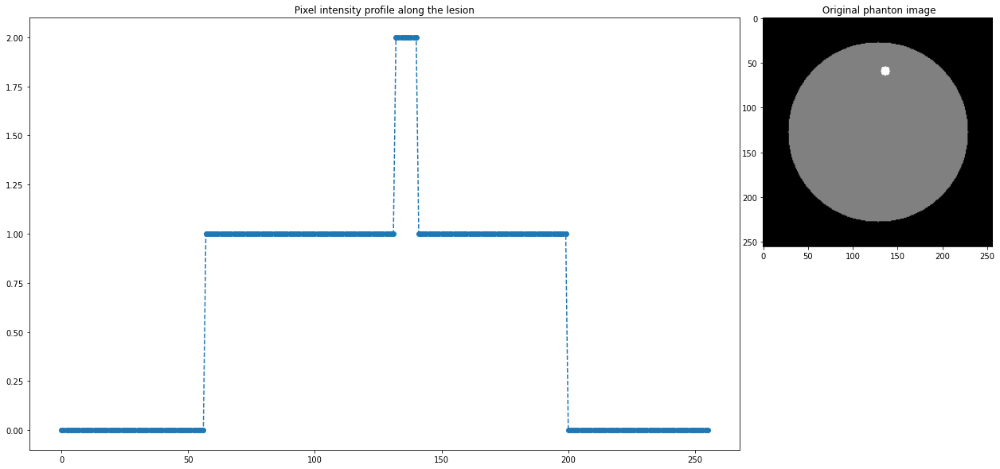

In [126]:
# insert your code here

#Creating the first tissue(Big)
t1 = create_circular_mask(256,256, radius=100)
#Creating the second tissue(Small)
t2 = create_circular_mask(256,256,center = (136,60), radius=5)
phanton = np.zeros((256,256))
#Put the tissues into the background
phanton[t1]= 1
phanton[t2]= 2

original_intensity = plot_pixel_intensity(phanton)

### 2.2 Create the projections of the phantom (2 points)

Generate the projections of the previously generated phantom using the ``radon`` transform from ``skimage.transform``. Play with the different parameters to optimise sinogram. Then, show the sinogram of the projections.

In this section, considered the following 2 approches:

``A``. Use different number of projections (i.e. 4, 20, 50, 100, 200, 300, 360) considering that in all cases the simulated projections cover the 360º. For example, 100 projections are taken in the range from 0º to 360º.

``B``. Use different ranges of angles (i.e. 4º, 20º, 50º, 100º, 200º, 300º, 360º) equally distributed.  For instance, 100 projections are taken in a range of 100º.

``Questions``: What is the effect of increasing/decrasing the number of proyections? Can you comment on the difference between approach A and B?

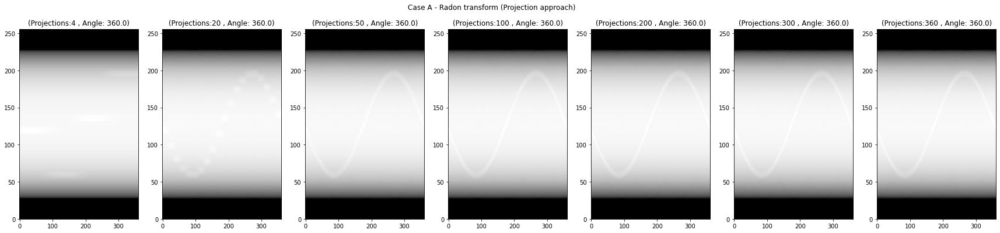

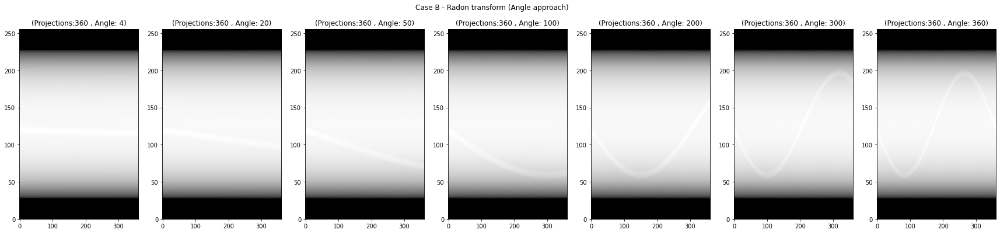

In [6]:
projections = [4, 20, 50, 100, 200, 300, 360]

#Case A
plt.figure(figsize=(30,6))
ang = 360.0
plt.suptitle('Case A - Radon transform (Projection approach)')
for i, col in enumerate(projections):
  projection = projections[i]
  ax = plt.subplot(1, len(projections), i+1)
  plot_sinogram(phanton,ang,projection)
  
plt.show()

#Case B
plt.figure(figsize=(30,6))
plt.suptitle('Case B - Radon transform (Angle approach)')
for i, col in enumerate(projections):
  ang_2 = projections[i]
  ax = plt.subplot(1, len(projections), i+1)
  plot_sinogram(phanton,ang_2,360)
plt.show()

### What is the effect of increasing/decrasing the number of proyections? Can you comment on the difference between approach A and B?

- As it is observed in the case A, it was an approach, where the projections was iterate between some values starting with 4 and ending in 360. Also, it was percibed that in the moment that was increased the number of projections, the values returned it was creating a sinosoidal wave, that it was more notory with high number of projections, this means, that, the number of projections influence with importance in the sinogram representation.

- In other hand, for the approach B, the angle it was varied, and with this, it was observed that the shape of the wave change turning to a sinosoidal when it was increased the angle, until achieve a sinosoidal representation.

### 2.3 Reconstruction with Filtered Back Projection (FBP) (2.5 points)

FBP is one of the most simple reconstruction methods to reconstruct images in CT. Explore the ``iradon`` from ``skimage.transform`` using the different filters available (Ramp filter (default), Shepp-logan, Cosine, Hamming, Hann).

Then, show the original and reconstructed images of the phantom.

Explore the two approches (A and B) described previously.

### General approach by filter

-----------------------------------------------------Filter ramp--------------------------------------------------



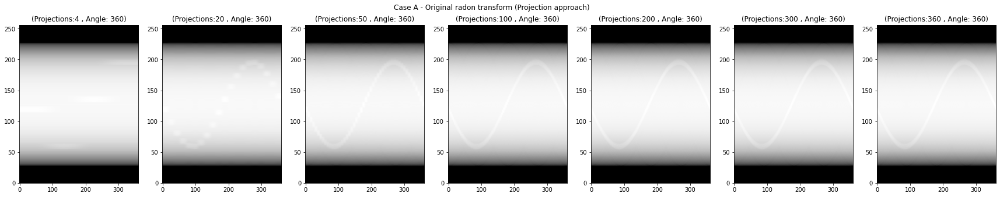

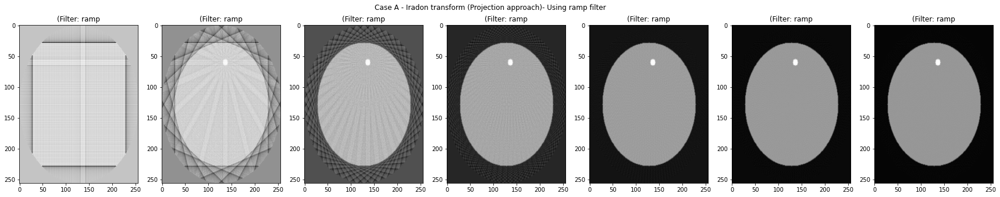

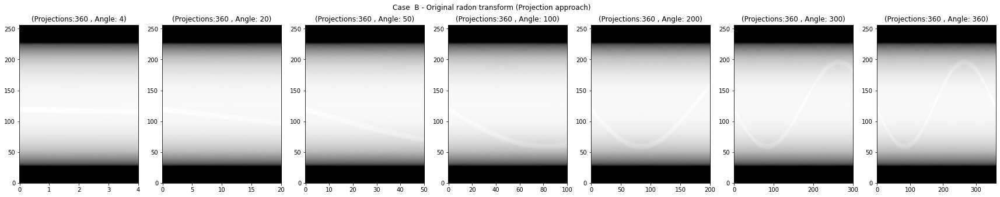

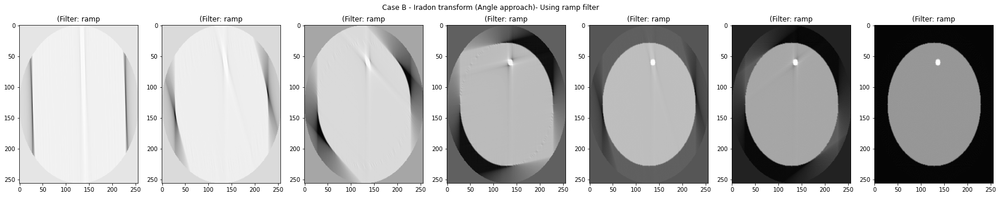

-----------------------------------------------------Filter shepp-logan--------------------------------------------------



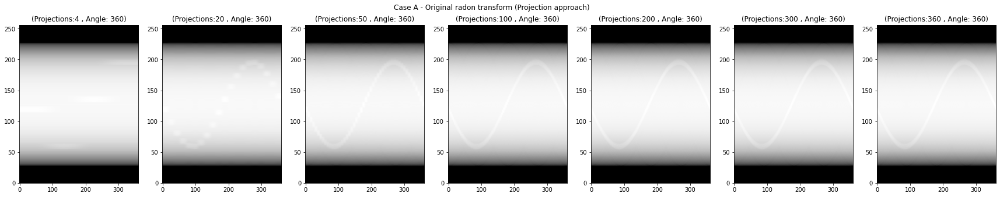

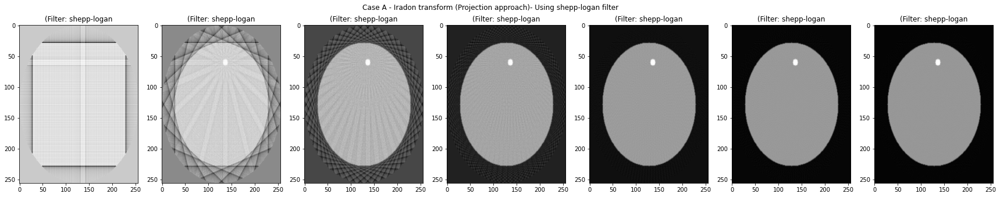

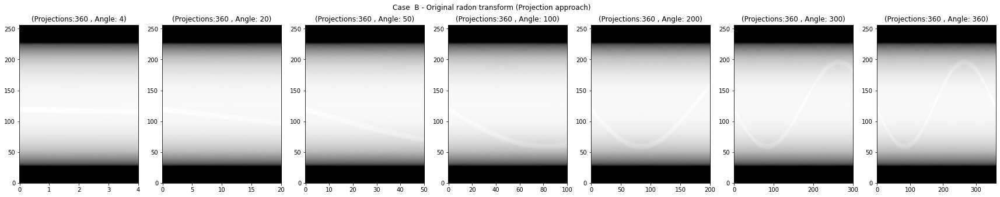

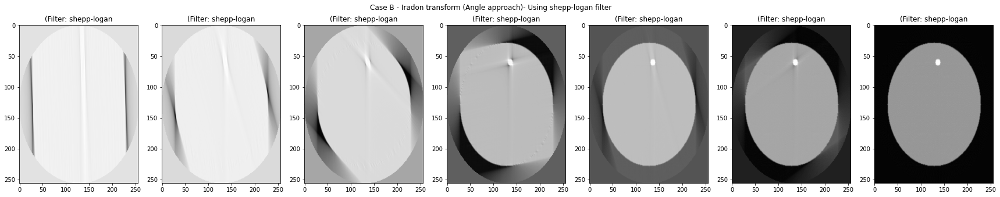

-----------------------------------------------------Filter cosine--------------------------------------------------



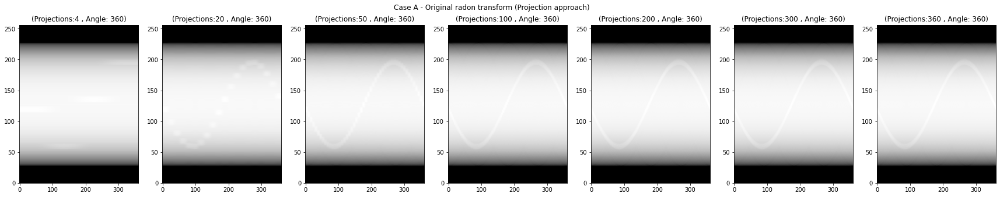

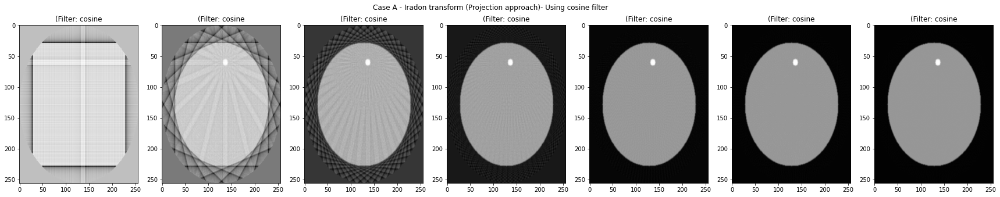

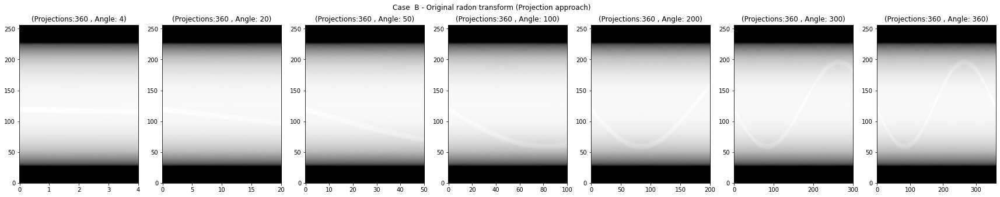

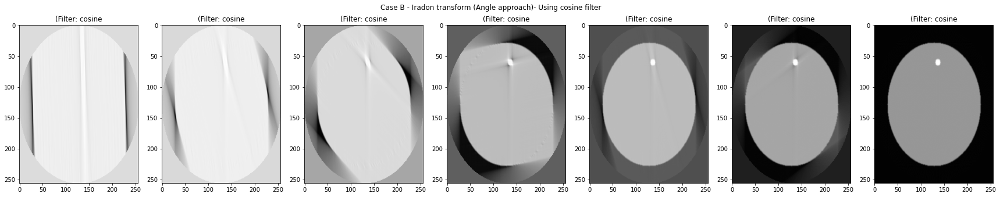

-----------------------------------------------------Filter hamming--------------------------------------------------



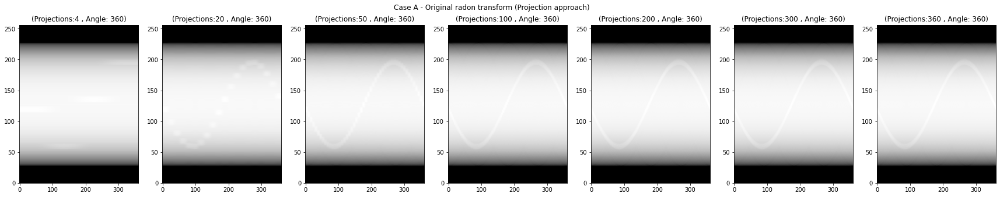

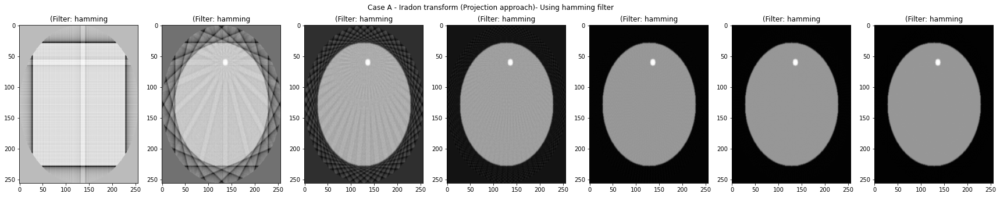

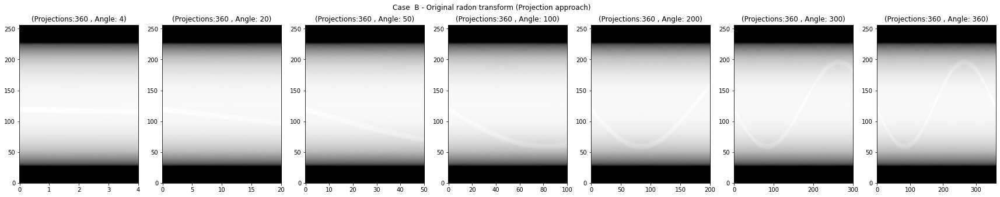

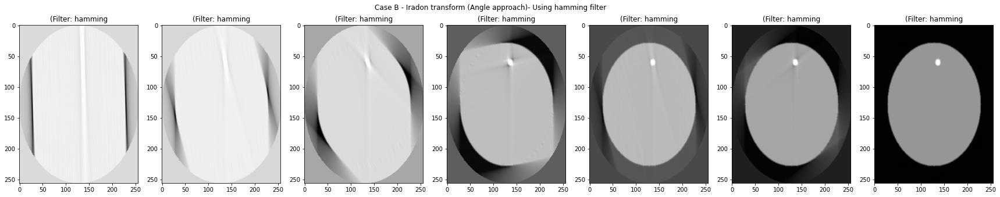

-----------------------------------------------------Filter hann--------------------------------------------------



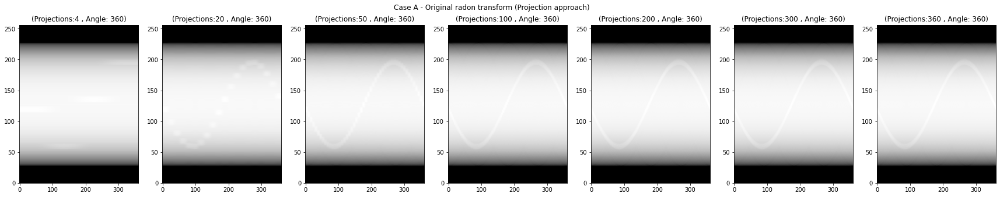

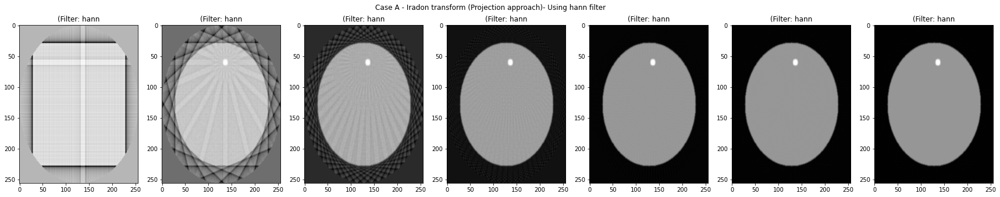

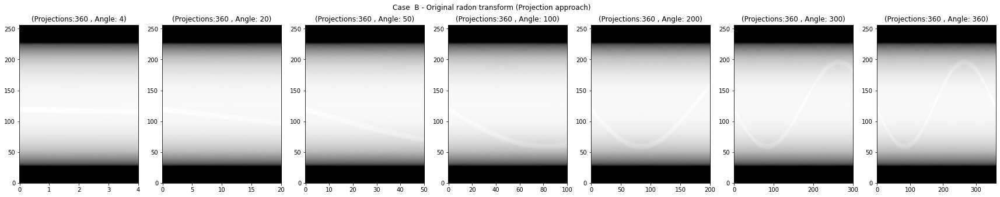

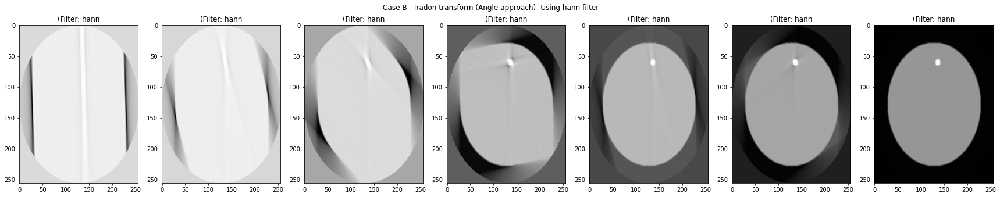

In [127]:
# insert your code here
from skimage.transform.radon_transform import _get_fourier_filter

filters = ['ramp', 'shepp-logan', 'cosine', 'hamming', 'hann']
projections = [4, 20, 50, 100, 200, 300, 360]


for filter in filters:
  print(f'-----------------------------------------------------Filter {filter}--------------------------------------------------')
  print('')
  # Original sinogram
  plt.figure(figsize=(30,5))
  ang = 360
  plt.suptitle(f'Case A - Original radon transform (Projection approach)')
  for i,projection in enumerate(projections):
    ax = plt.subplot(1, len(projections), i+1)
    plot_sinogram(phanton,ang,projection)  
  plt.show()

   #Case A
  plt.figure(figsize=(30,5))
  plt.suptitle(f'Case A - Iradon transform (Projection approach)- Using {filter} filter')
  for i, projection in enumerate(projections):
    ax = plt.subplot(1, len(projections), i+1)
    plot_sinogram_iradon(phanton,ang,projection,filter)
  plt.show()

  plt.figure(figsize=(30,5))
  projection = 360
  plt.suptitle(f'Case  B - Original radon transform (Projection approach)')
  for i,ang in enumerate(projections):
    ax = plt.subplot(1, len(projections), i+1)
    plot_sinogram(phanton,ang,projection)  
  plt.show()

  #Case B
  plt.figure(figsize=(30,5))
  plt.suptitle(f'Case B - Iradon transform (Angle approach)- Using {filter} filter')

  for i, ang_2 in enumerate(projections):
    ax = plt.subplot(1, len(projections), i+1)
    plot_sinogram_iradon(phanton,ang_2,360,filter)
  plt.show()

### Approach by number of projection

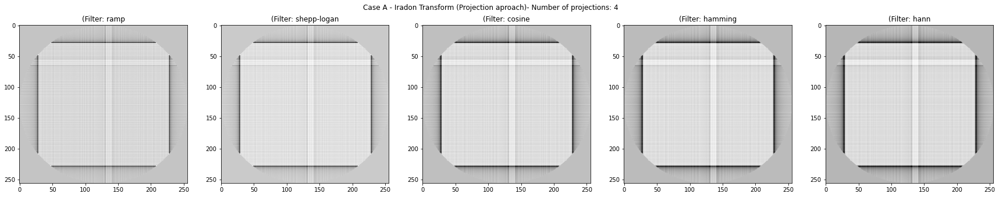

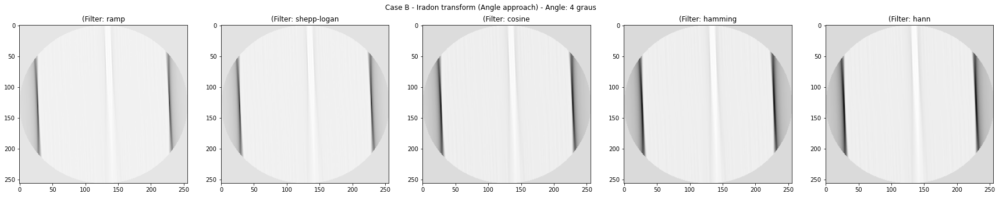

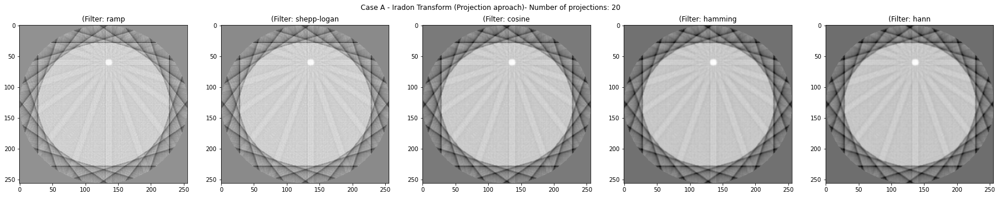

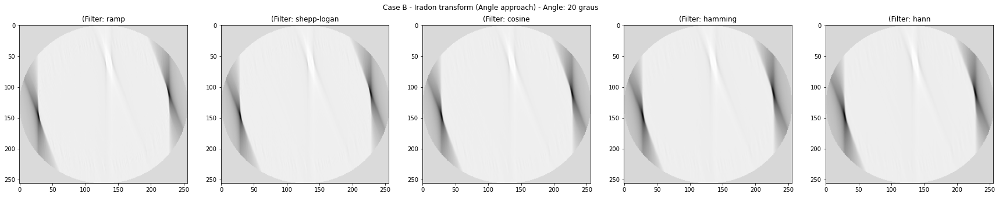

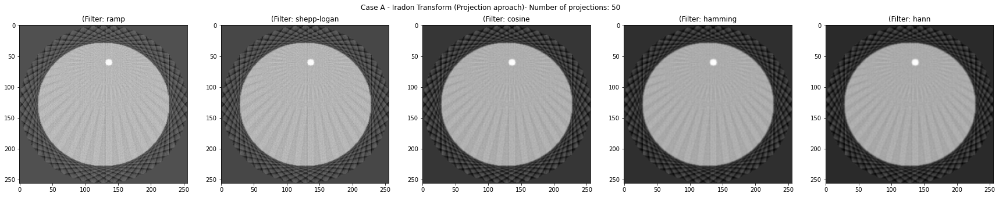

...

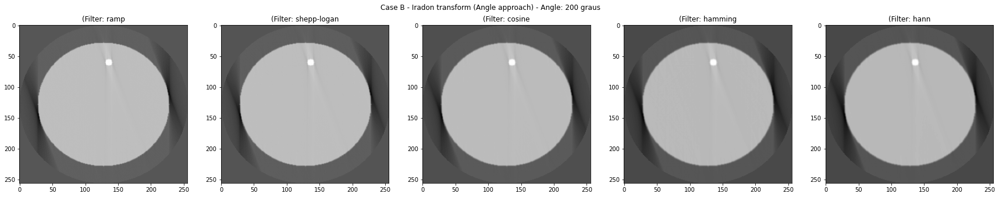

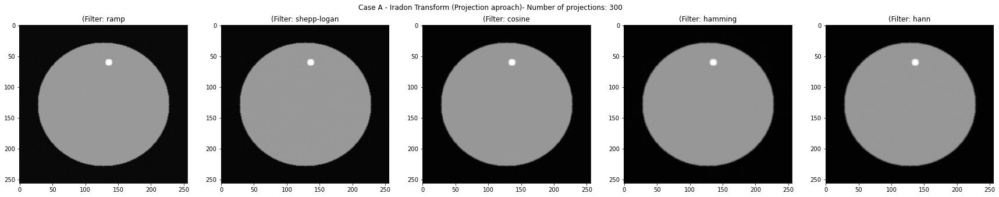

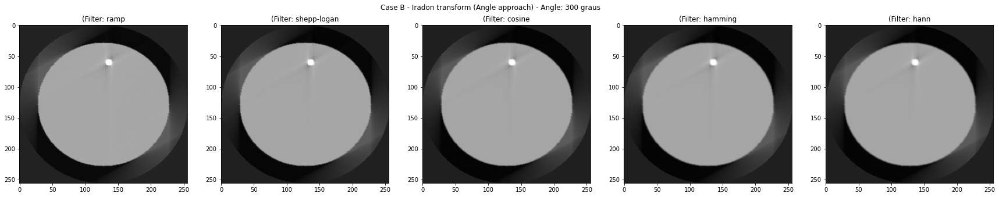

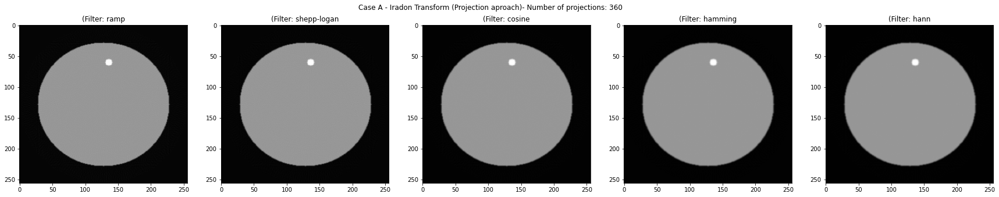

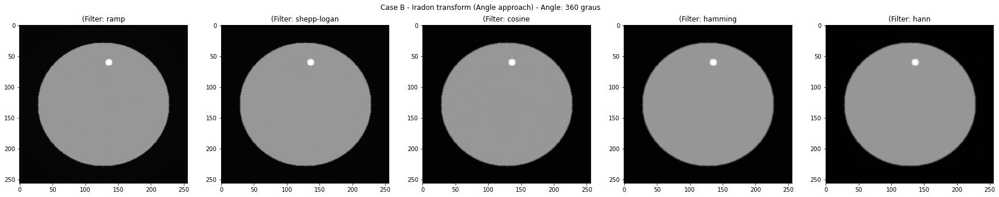

In [128]:
# insert your code here
from skimage.transform.radon_transform import _get_fourier_filter

filters = ['ramp', 'shepp-logan', 'cosine', 'hamming', 'hann']
projections = [4, 20, 50, 100, 200, 300, 360]

case_a = []
case_b = []

projection_b = 360
ang_a = 360

for ang in projections:
  
  #Case A
  projection_a = ang
  
  plt.figure(figsize=(30,5))
  plt.suptitle(f'Case A - Iradon Transform (Projection aproach)- Number of projections: {projection_a}')
  for i, filter in enumerate(filters):
    ax = plt.subplot(1, len(filters), i+1)
    case_a.append({'Filter':filter,'Projection':projection_a,'Image':plot_sinogram_iradon(phanton,ang_a,projection_a,filter)})
  plt.show()

  # Case B
  plt.figure(figsize=(30,5))
  
  plt.suptitle(f'Case B - Iradon transform (Angle approach) - Angle: {ang} graus')
  for i, filter in enumerate(filters):
    ax = plt.subplot(1, len(filters), i+1)
    case_b.append({'Filter':filter,'Angle':ang,'Image':plot_sinogram_iradon(phanton,ang,projection_b,filter)})
  plt.show()

### 2.4 Compare the reconstructed signals (1 points)

Make use of the ``matplotlib`` to compare the original and reconstructed signals. In order to do so, make a single plot with the different pixel intensity profiles of the lesion (as done in 2.1). Then, discuss the results.

### Projection approach

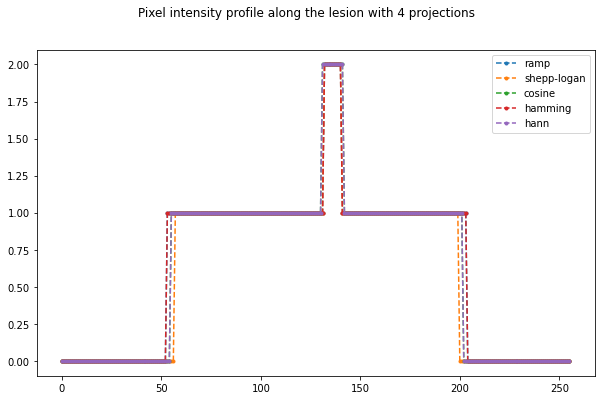

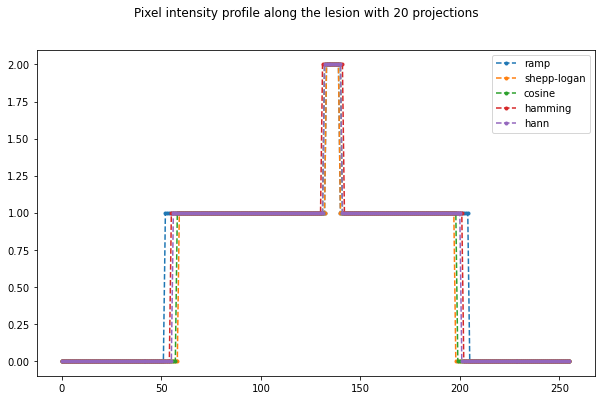

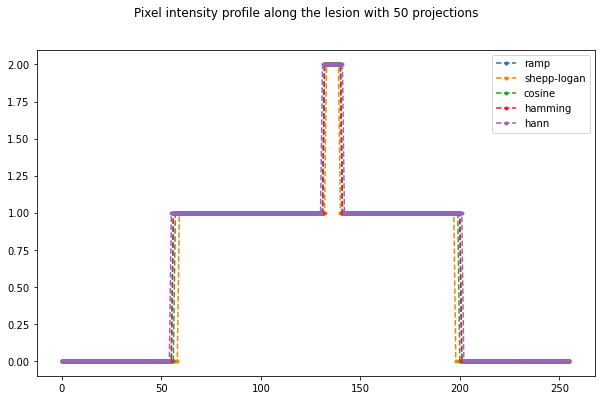

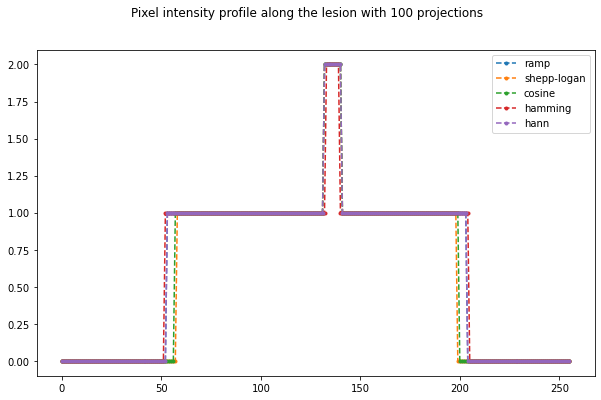

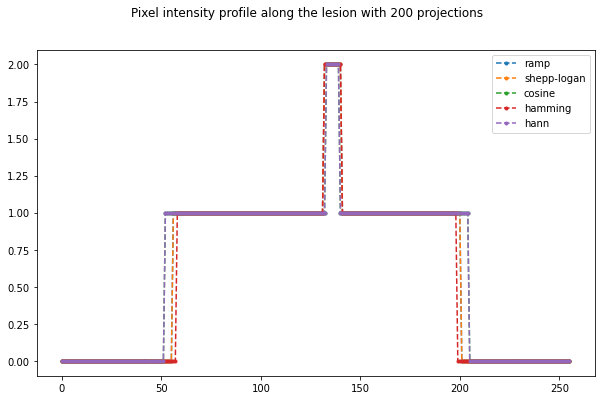

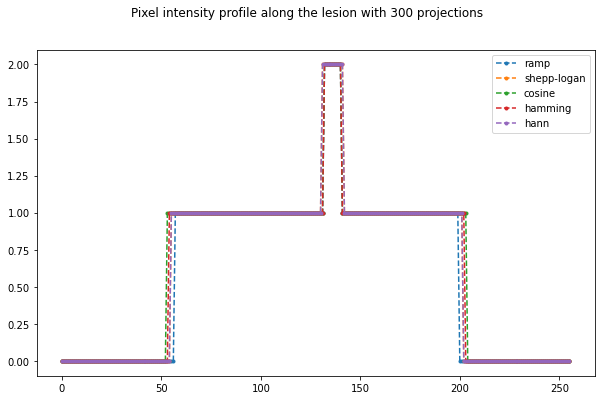

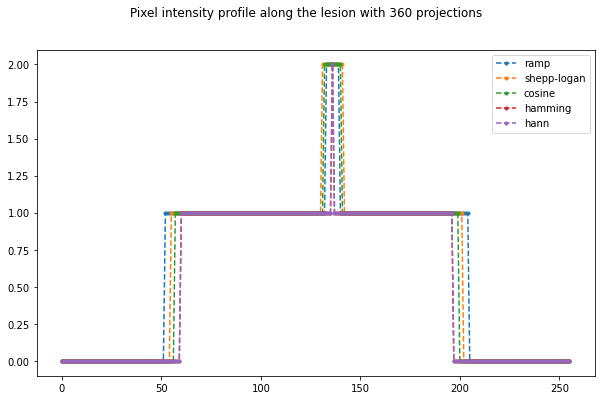

In [129]:
projections = [4, 20, 50, 100, 200, 300, 360]

for projection in projections:
  plt.figure(figsize=(10, 6), )
  title = f'Pixel intensity profile along the lesion with {projection} projections'
  plt.suptitle(title)
  labels=[]
  for case in case_a:
    
    if case['Projection']== projection:
      multiple_pixel_intensity(case,case['Filter'])
      labels.append(case['Filter'])
  #plt.legend(labels,ncol=len(labels))
  plt.legend(labels,ncol=1)
  plt.show()

### Angle approach

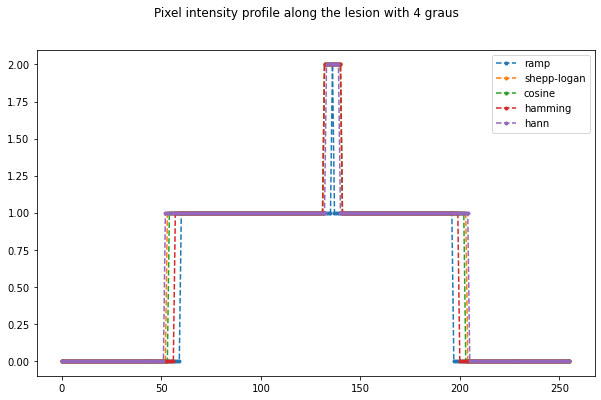

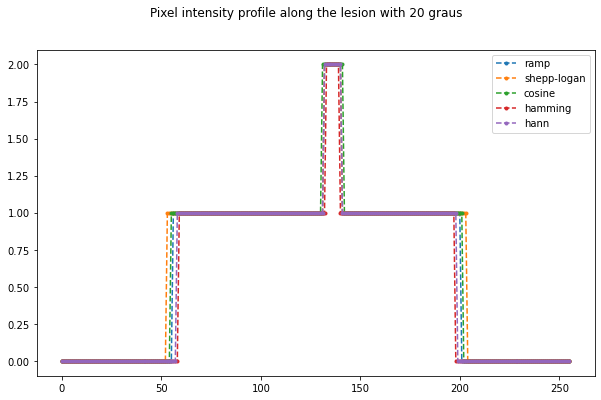

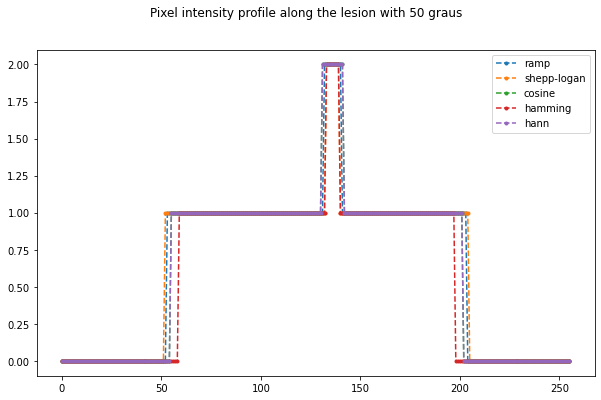

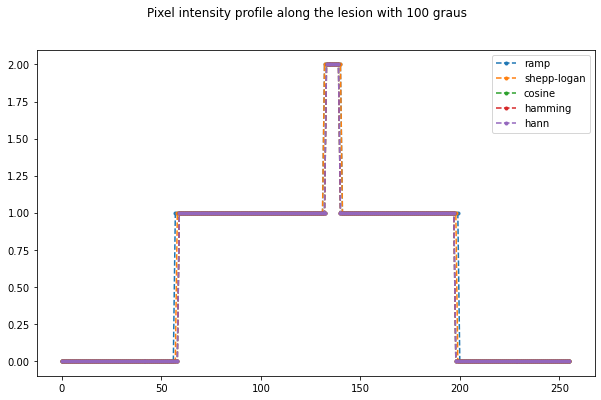

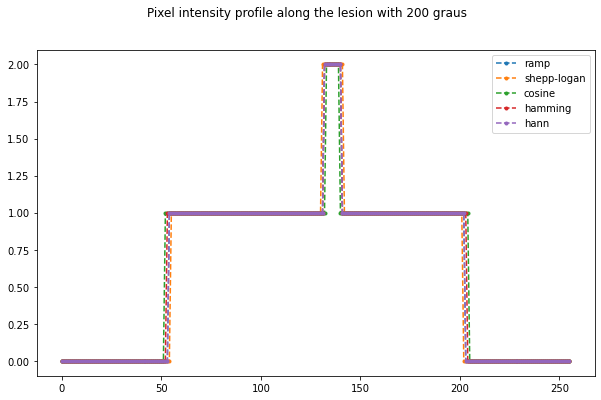

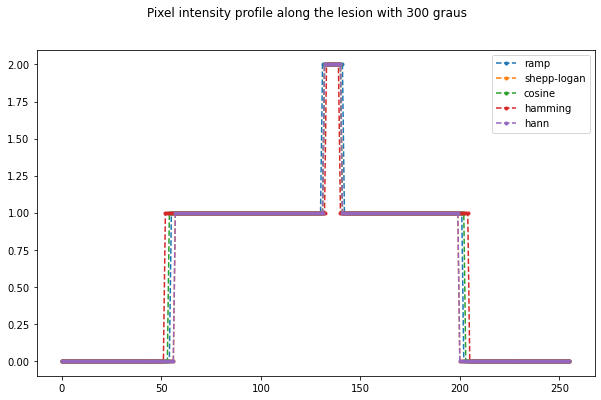

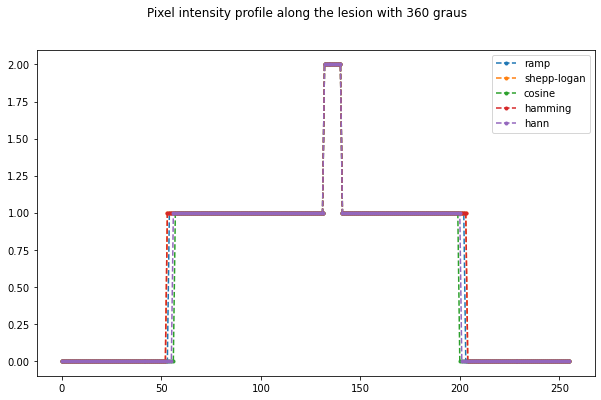

In [130]:
for angle in projections:
  plt.figure(figsize=(10, 6), )
  title = f'Pixel intensity profile along the lesion with {angle} graus'
  plt.suptitle(title)
  labels=[]
  for case in case_b:
    
    if case['Angle']== angle:
      multiple_pixel_intensity(case,case['Filter'])
      labels.append(case['Filter'])
  #plt.legend(labels,ncol=len(labels))
  plt.legend(labels,ncol=1)
  plt.show()

### Observations

- As it is observed in the plots with the projection approach, it is possible to observe the difference between all the filters, and as is percibed in the plots with less projections it was complicated to get differences, but when it was increased the number of projections, the image reconstrunction by each filter, show that ramp and hann filter was the best but also it was very similar comparing with the other filters, the only difference is that hann filter lose some intensity values in the reconstructions as it is appreciated in the last plot of this approach.

- For the second approach, where the iteration of the angles was the aim, the behavior of the filters present results more similars that the the precious approach, however, the cosine filter present the best reconstruction result. 

### 2.5 Reconstructing noisy sinograms (2 points)

Add Poison noise (``np.random.poisson``; perhaps with lam = 10) to your previous sinograms and reconstruct the phantom images with the different filters. Plot the reconstruction image and the intensity profile along the lession. Then, comment on the effects of the filters on the reconstructed phatom images.

#### Example of reconstructing noisy sinograms

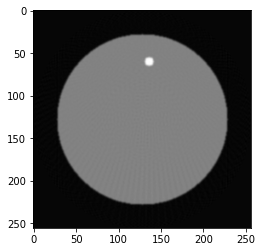

4


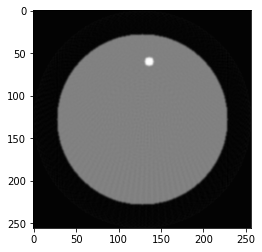

In [131]:
# insert your code here
plt.imshow(plot_sinogram_iradon(phanton,ang_a,150,filter), cmap='gray')
plt.show()
print(np.random.poisson(lam=10, size=None))

plt.imshow(plot_sinogram_iradon_poison(phanton,ang_a,150,filter), cmap='gray')

#### Reconstruction of the phantom images with different filters

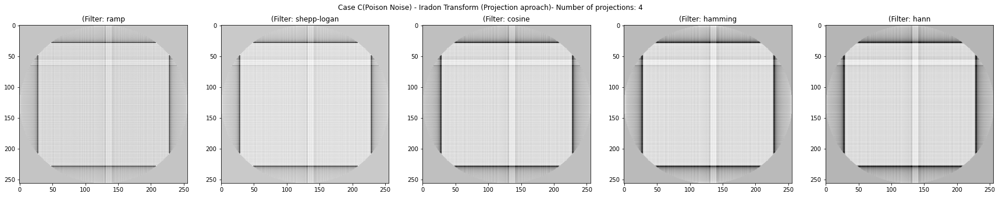

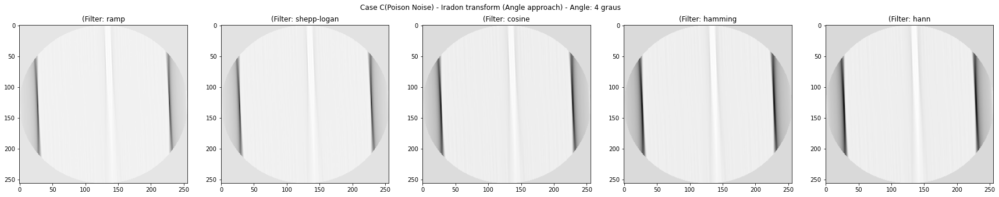

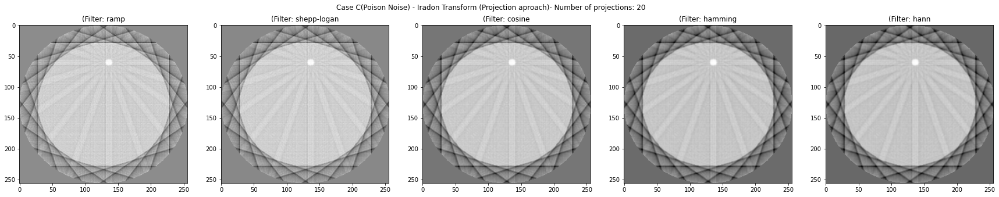

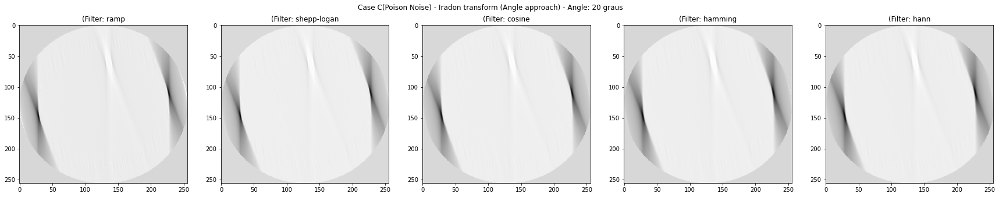

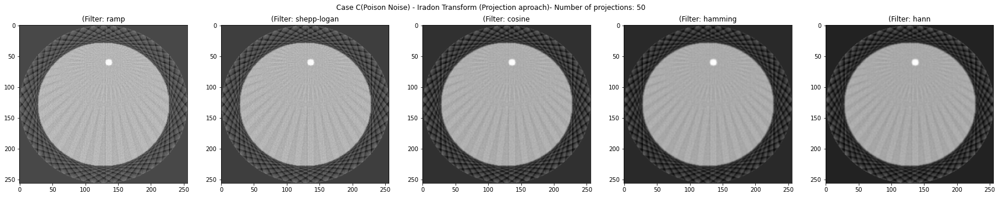

...

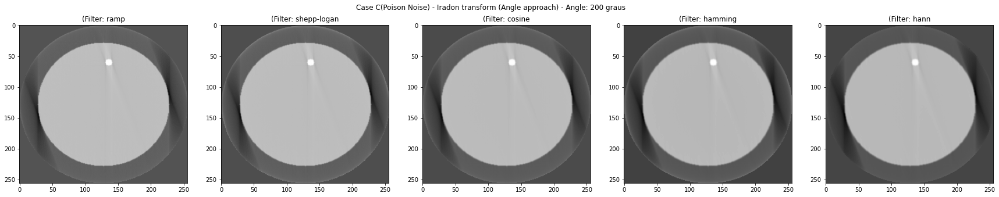

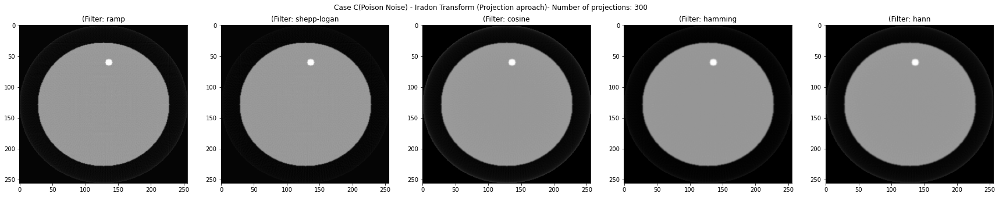

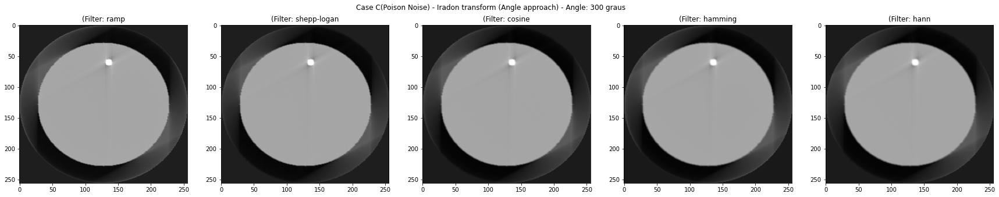

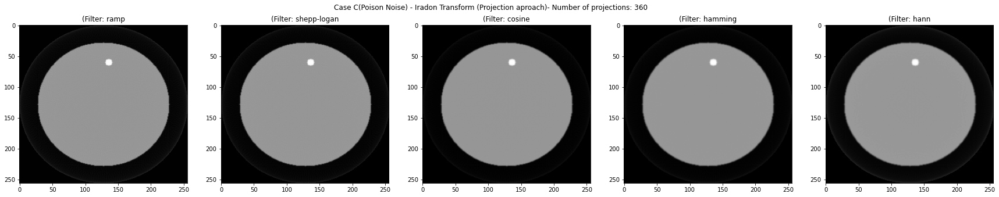

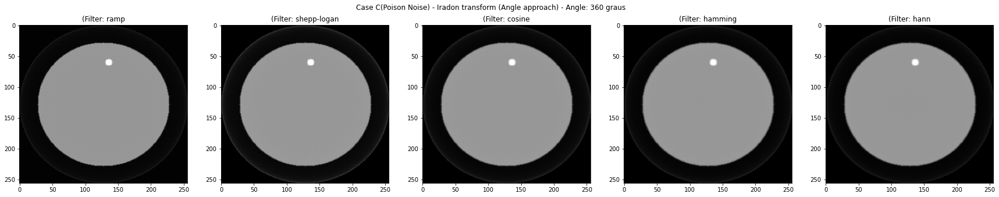

In [132]:
filters = ['ramp', 'shepp-logan', 'cosine', 'hamming', 'hann']
projections = [4, 20, 50, 100, 200, 300, 360]

case_c = []
case_d = []

ang_a = 360
projection_b = 360


for ang in projections:
  
  #Case A
  projection_a = ang
  
  plt.figure(figsize=(30,5))
  plt.suptitle(f'Case C(Poison Noise) - Iradon Transform (Projection aproach)- Number of projections: {projection_a}')
  for i, filter in enumerate(filters):
    ax = plt.subplot(1, len(filters), i+1)
    case_c.append({'Filter':filter,'Projection':projection_a,'Image':plot_sinogram_iradon_poison(phanton,ang_a,projection_a,filter)})
  plt.show()

  # Case B
  plt.figure(figsize=(30,5))
  
  plt.suptitle(f'Case C(Poison Noise) - Iradon transform (Angle approach) - Angle: {ang} graus')
  for i, filter in enumerate(filters):
    ax = plt.subplot(1, len(filters), i+1)
    case_d.append({'Filter':filter,'Angle':ang,'Image':plot_sinogram_iradon_poison(phanton,ang,projection_b,filter)})
  plt.show()

###  Intensity profile along the lession

##### Case c intensity profile along the lession

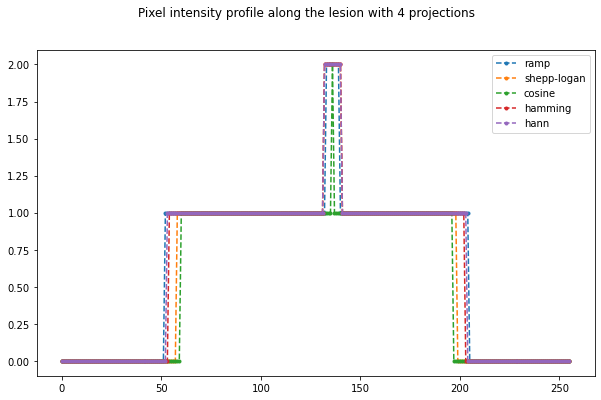

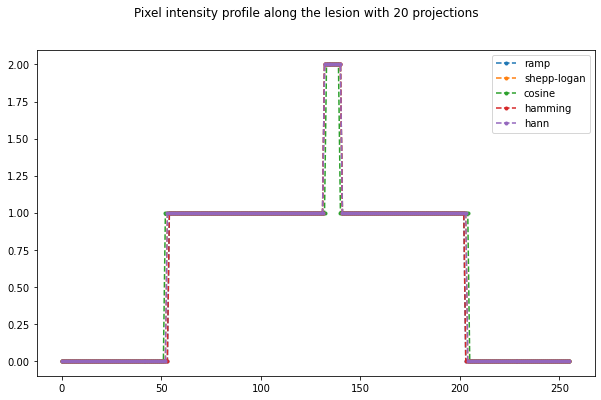

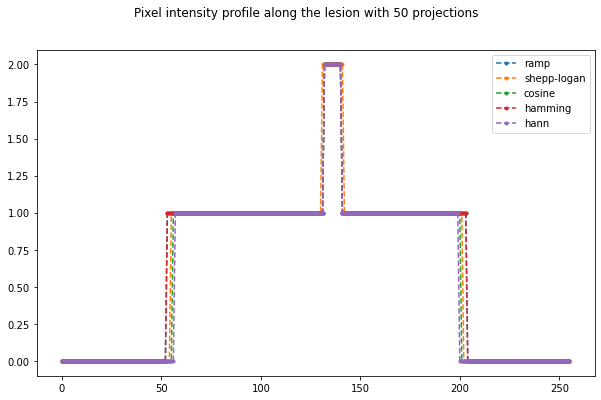

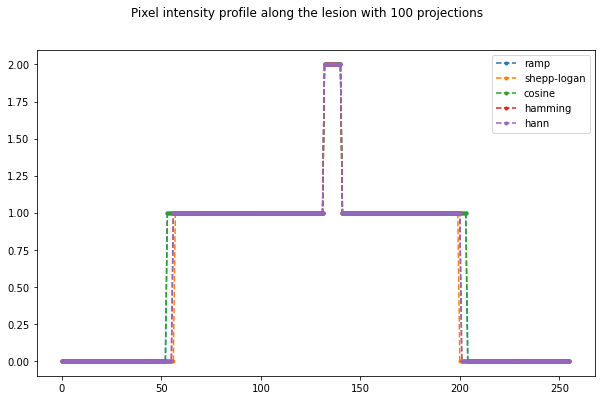

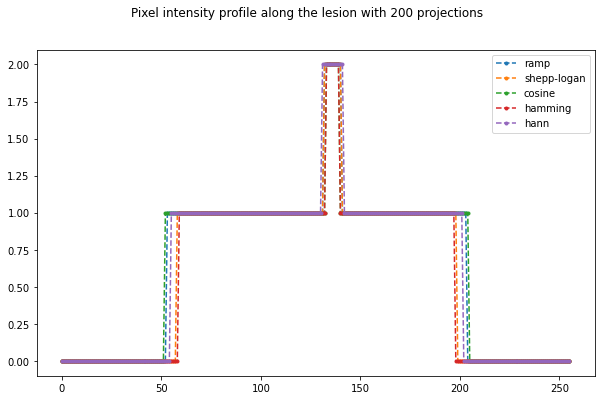

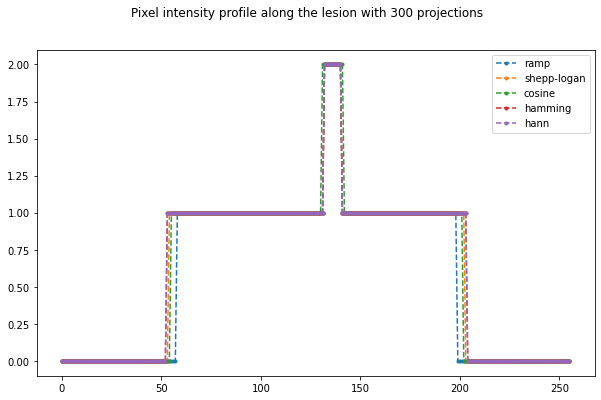

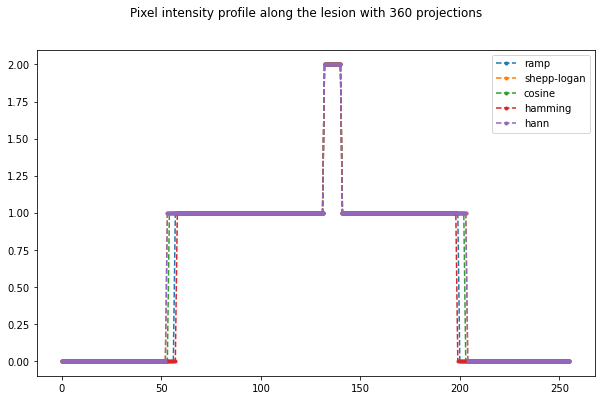

In [133]:
projections = [4, 20, 50, 100, 200, 300, 360]

for projection in projections:
  plt.figure(figsize=(10, 6), )
  title = f'Pixel intensity profile along the lesion with {projection} projections'
  plt.suptitle(title)
  labels=[]
  for case in case_c:
    
    if case['Projection']== projection:
      multiple_pixel_intensity(case,case['Filter'])
      labels.append(case['Filter'])
  #plt.legend(labels,ncol=len(labels))
  plt.legend(labels,ncol=1)
  plt.show()

#### Case D intensity profile along the lession

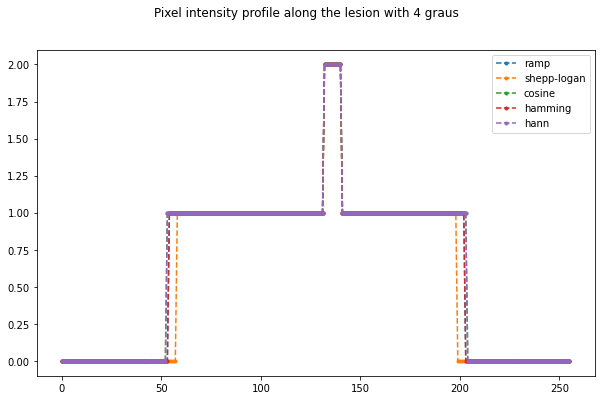

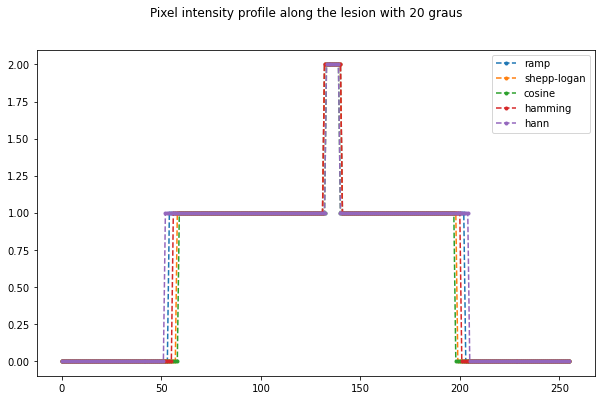

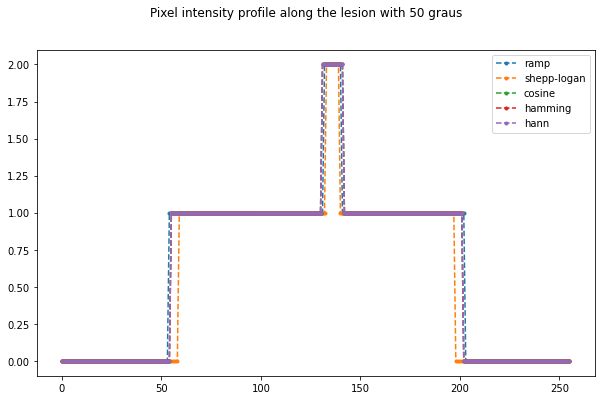

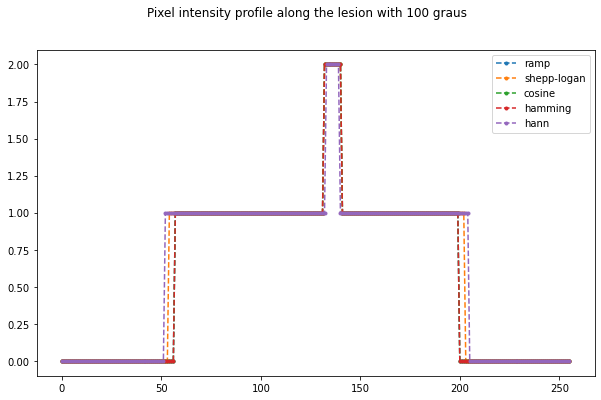

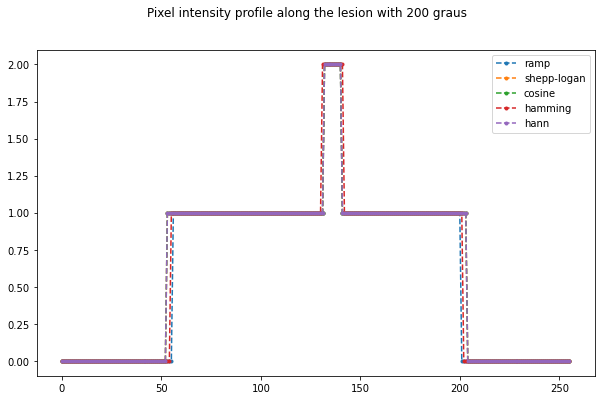

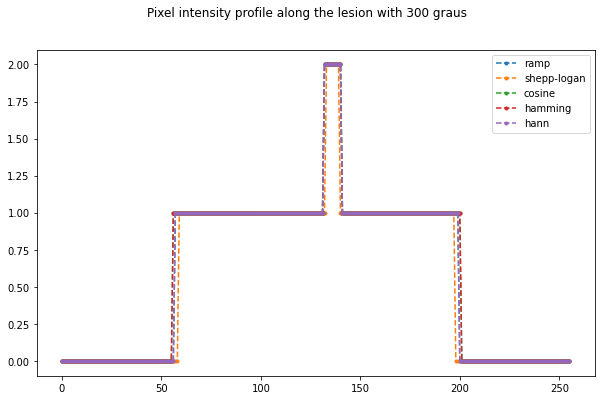

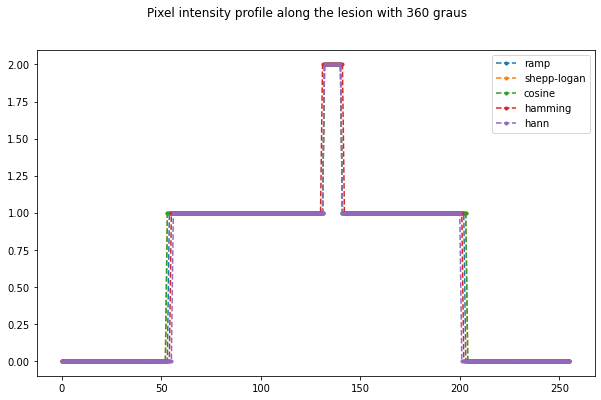

In [134]:
for angle in projections:
  plt.figure(figsize=(10, 6), )
  title = f'Pixel intensity profile along the lesion with {angle} graus'
  plt.suptitle(title)
  labels=[]
  for case in case_d:
    
    if case['Angle']== angle:
      multiple_pixel_intensity(case,case['Filter'])
      labels.append(case['Filter'])
  #plt.legend(labels,ncol=len(labels))
  plt.legend(labels,ncol=1)
  plt.show()

### Observations

It was added the posion noise to next reconstruct the image for both approaches, with this it is observed that cosine and hamming filter present better results for the projections with 360, being hamming better, because present better results from early projections, 
the Hamming filter is preferred due to its relatively narrow main lobe width and good attenuation of the first few side lobes. For the second approach it was oberseved that hamming filter cancell the nearest side lobe, but a poorer job of cancelling the rest, also, for this approach it was better hamming because speed and good-enough noise performance it was percived.

### 2.6 Sheep logan phantom (1 point)

So far we have used a quite simple phantom with only 2 tissues. Now, repeat the prior analysis using a (slightly) more advanced head test object, the Sheep-logan phantom. Do you observe particular differences between the reconstrucction results from both phantoms? 


155


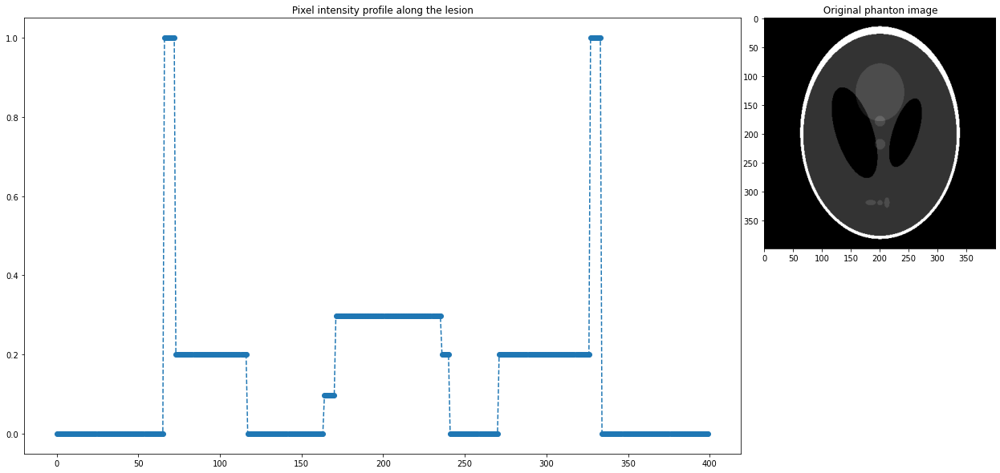

In [187]:
from skimage.data import shepp_logan_phantom
image = shepp_logan_phantom()

plot_intensity_iradon_lesson(image)  

### Create the projection phantom

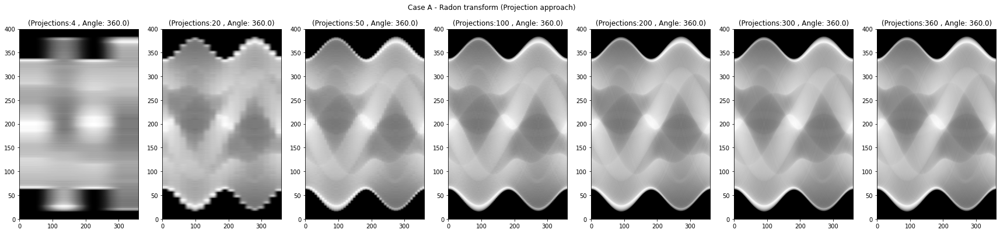

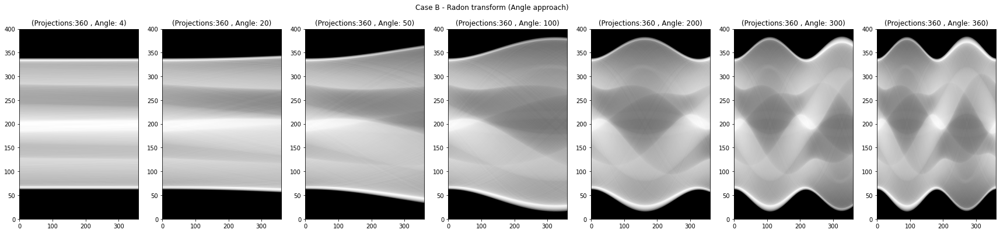

In [173]:
projections = [4, 20, 50, 100, 200, 300, 360]

#Case A
plt.figure(figsize=(30,6))
ang = 360.0
plt.suptitle('Case A - Radon transform (Projection approach)')
for i, col in enumerate(projections):
  projection = projections[i]
  ax = plt.subplot(1, len(projections), i+1)
  plot_sinogram(image,ang,projection)
  
plt.show()

#Case B
plt.figure(figsize=(30,6))
plt.suptitle('Case B - Radon transform (Angle approach)')
for i, col in enumerate(projections):
  ang_2 = projections[i]
  ax = plt.subplot(1, len(projections), i+1)
  plot_sinogram(image,ang_2,360)
plt.show()

### Reconstruction with Filtered Back Projection (FBP)

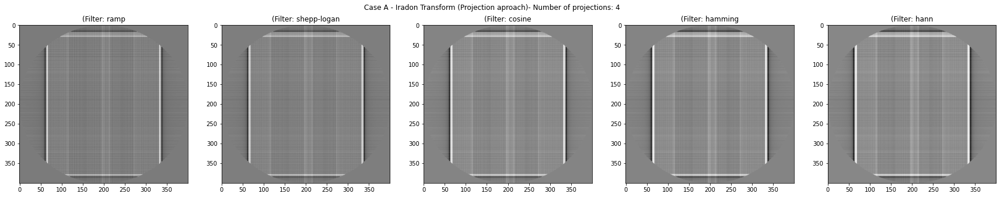

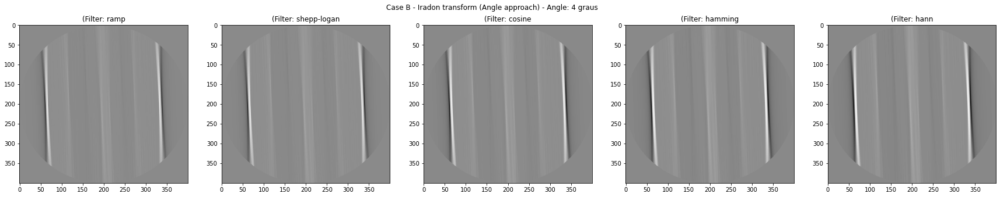

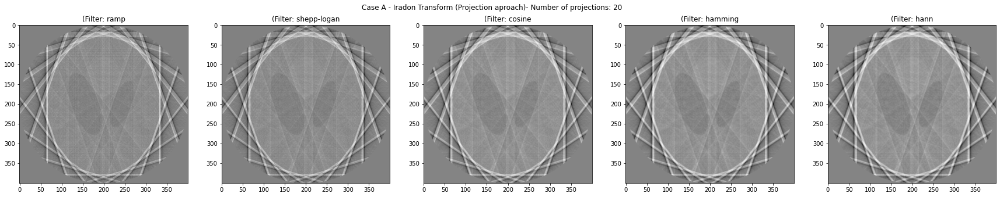

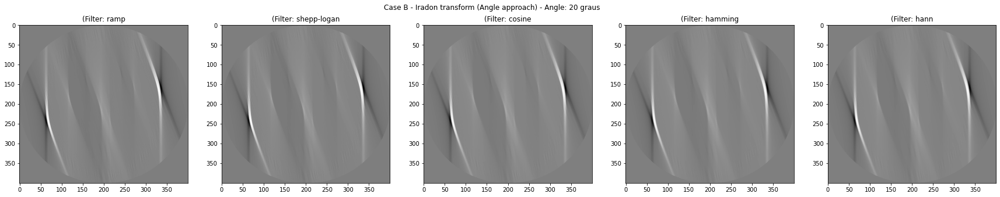

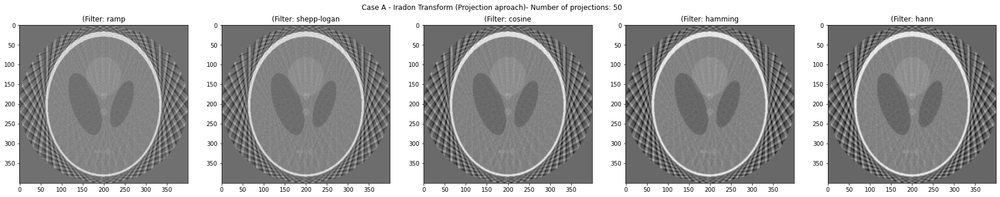

...

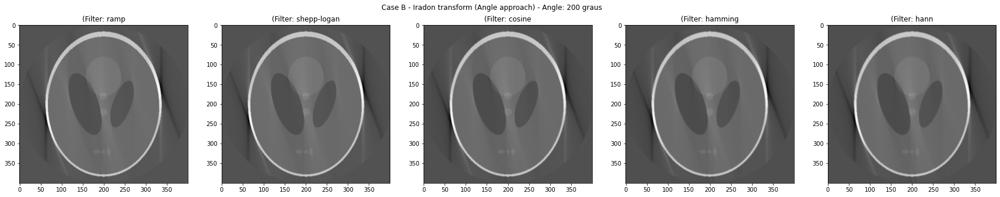

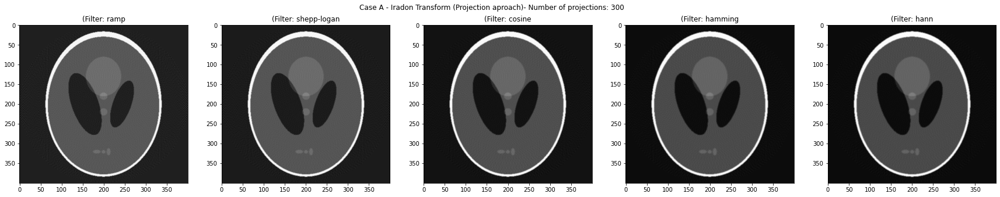

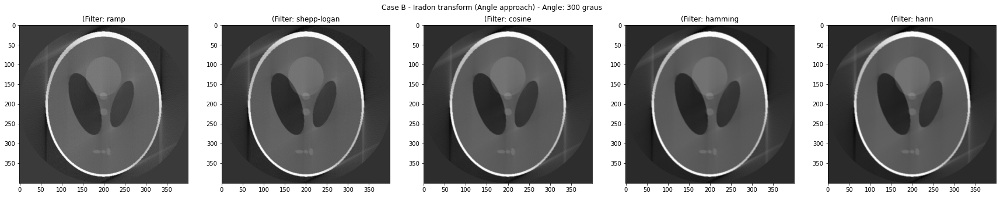

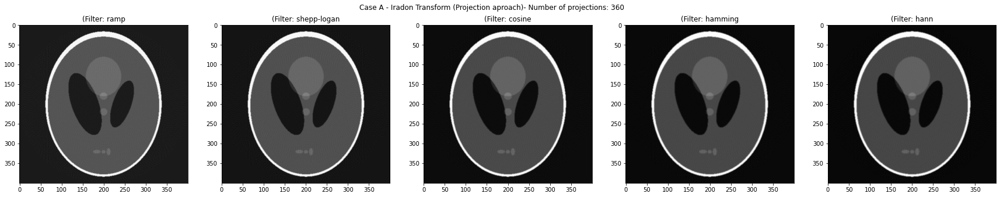

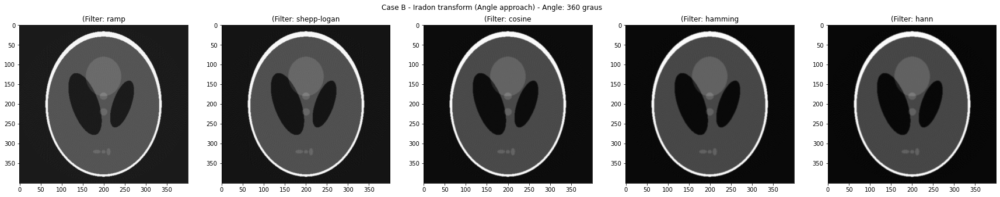

In [188]:
# insert your code here
from skimage.transform.radon_transform import _get_fourier_filter

filters = ['ramp', 'shepp-logan', 'cosine', 'hamming', 'hann']
projections = [4, 20, 50, 100, 200, 300, 360]

case_e = []
case_f = []

projection_b = 360
ang_a = 360

for ang in projections:
  
  #Case A
  projection_a = ang
  
  plt.figure(figsize=(30,5))
  plt.suptitle(f'Case A - Iradon Transform (Projection aproach)- Number of projections: {projection_a}')
  for i, filter in enumerate(filters):
    ax = plt.subplot(1, len(filters), i+1)
    case_e.append({'Filter':filter,'Projection':projection_a,'Image':plot_sinogram_iradon(image,ang_a,projection_a,filter)})
  plt.show()

  # Case B
  plt.figure(figsize=(30,5))
  
  plt.suptitle(f'Case B - Iradon transform (Angle approach) - Angle: {ang} graus')
  for i, filter in enumerate(filters):
    ax = plt.subplot(1, len(filters), i+1)
    case_f.append({'Filter':filter,'Angle':ang,'Image':plot_sinogram_iradon(image,ang,projection_b,filter)})
  plt.show()

### Intensity profile along the lession

#### Projection approach

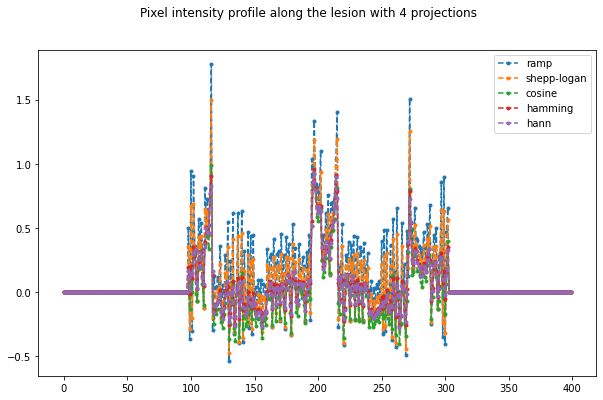

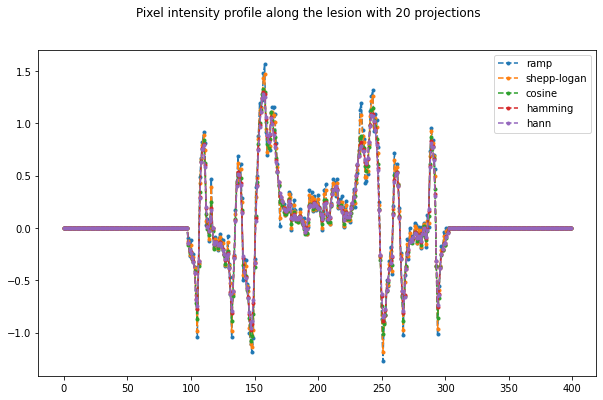

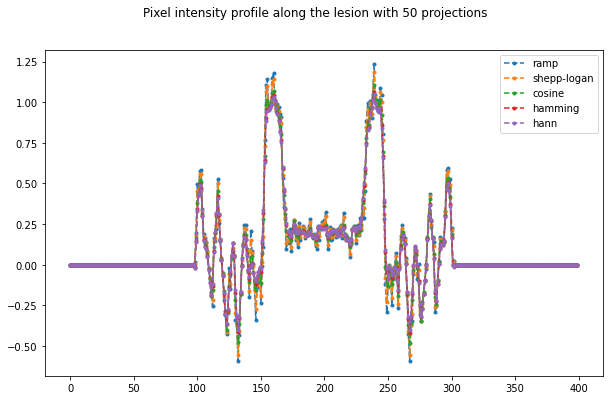

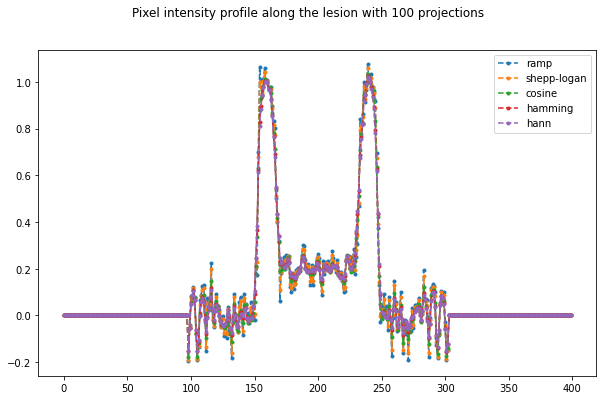

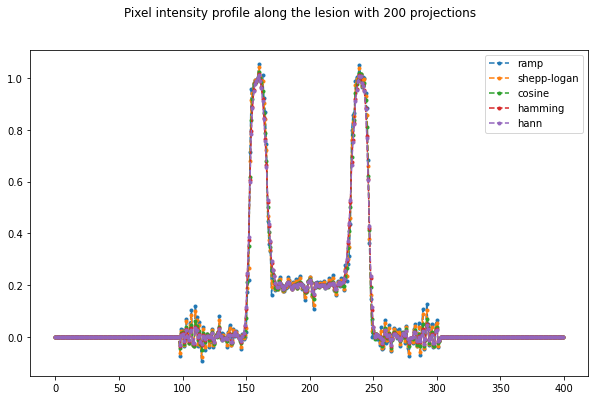

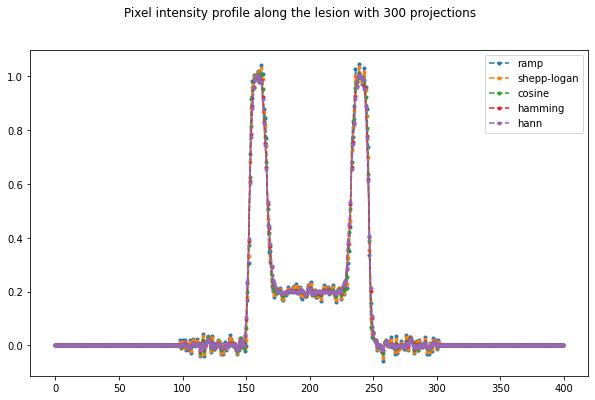

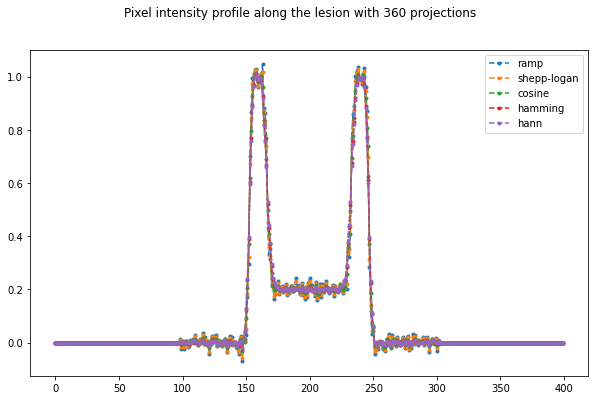

In [209]:
projections = [4, 20, 50, 100, 200, 300, 360]
lesson_loc = find_lesson_1(image)
for projection in projections:
  plt.figure(figsize=(10, 6), )
  title = f'Pixel intensity profile along the lesion with {projection} projections'
  plt.suptitle(title)
  labels=[]
  for case in case_e:
    
    if case['Projection']== projection:
      multiple_pixel_intensity_label_2(case['Image'],case['Filter'],lesson_loc)
      labels.append(case['Filter'])
  #plt.legend(labels,ncol=len(labels))
  plt.legend(labels,ncol=1)
  plt.show()

#### Angle approach

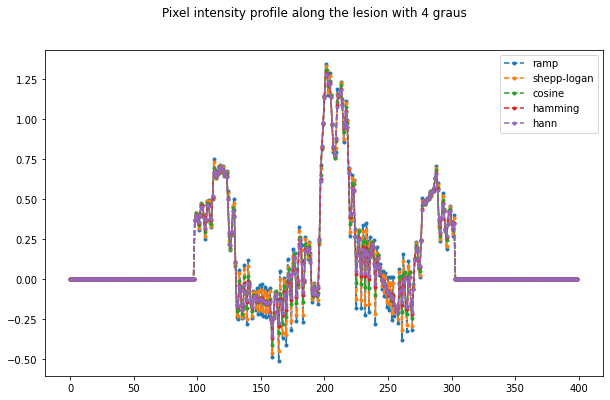

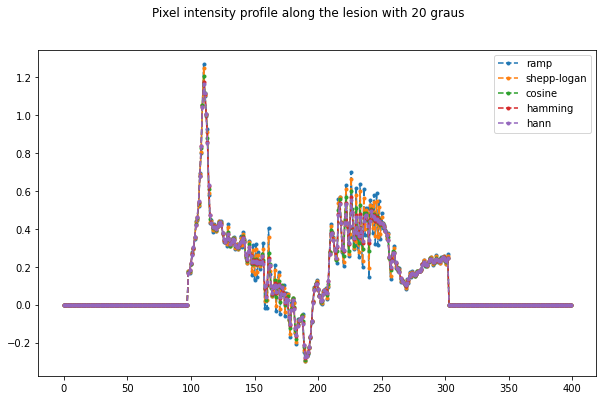

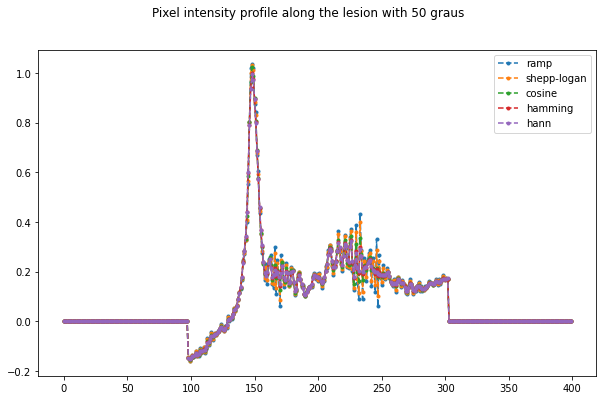

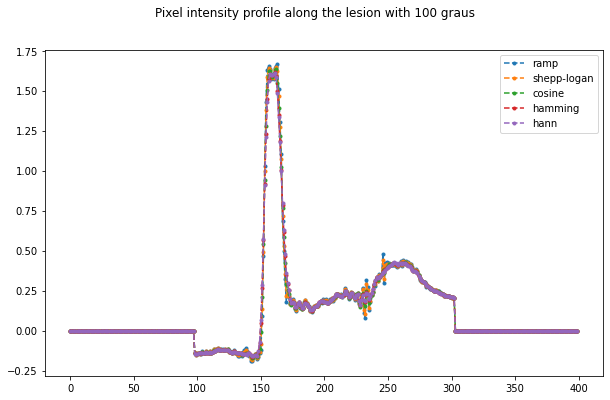

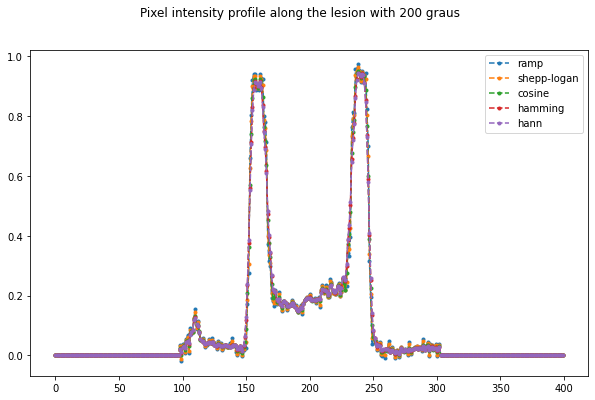

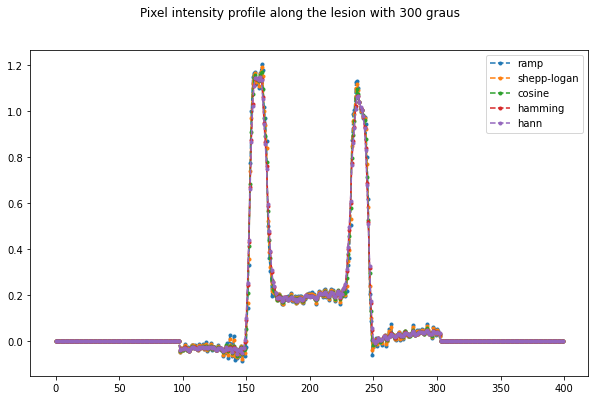

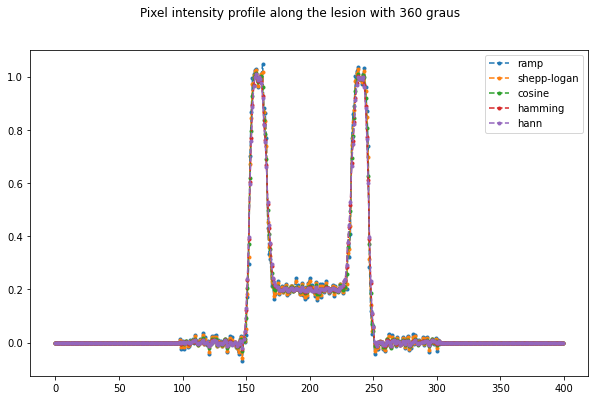

In [211]:
for angle in projections:
  plt.figure(figsize=(10, 6), )
  title = f'Pixel intensity profile along the lesion with {angle} graus'
  plt.suptitle(title)
  labels=[]
  for case in case_f:
    if case['Angle']== angle:
      multiple_pixel_intensity_label_2(case['Image'],case['Filter'],lesson_loc)
      labels.append(case['Filter'])
  #plt.legend(labels,ncol=len(labels))
  plt.legend(labels,ncol=1)
  plt.show()

## Conclusions

1. Both images present difference bettwen the intensity values and the number of tissues represented by each of the images.
2. Each image that was tested and reconstructed by all the filters present good results with hamming, followed by hann in the second image and cosine for the first in the projection approach.
3. The worst performance it was presented by ramp filter that returns intensity values with high variation and take many time to reconstruct the image.
